In [1]:
import sys
sys.path.append("../..")

In [2]:
import matplotlib.pyplot as plt

In [3]:
%matplotlib inline

In [4]:
import scipy, GPy, os, ast
import pandas as pd
import matplotlib as mpl
import seaborn as sns
from gp_growth.storage import mongo
db = mongo.MongoDB()

from gp_growth import factory, testStatistic, normal
from gp_growth.categorical import Categorical
from gp_growth import metric
from gp_growth.data import filter, growth
from gp_growth.storage import searcher

In [5]:
import GPy
import scipy
import numpy as np

In [7]:
from matplotlib.colors import LinearSegmentedColormap

cmap = LinearSegmentedColormap.from_list('mycmap', [(0, 'blue'),
                                                    (.05, 'white'),
                                                    (.95, 'white'),
                                                    (1, 'red')]
                                        )

In [8]:
import matplotlib.colors as clrs
import matplotlib

In [9]:
bound_cmap = clrs.BoundaryNorm([0,.05,.95,1],3)
bound_cmap.vmax

1

In [10]:
def gpParams(gp):
    ret = {}

    for p in gp.kern.parameters:
        if p.param_array.shape[0] > 1:
    #         print p
            n = p.parameter_names()[0]
            for i in range(p.param_array.shape[0]):
                ret[gp.kern.name+"_"+n+"_"+str(i)] = p.param_array[i]
        else:
            ret[gp.kern.name+"_"+p.parameter_names()[0]] = p[0]
    #         print p
    #         ret[p.name] = p[0]

    for p in gp.likelihood.parameters:
        # need to go deeper
        if isinstance(p,GPy.likelihoods.likelihood.Likelihood):
            for t in p.parameters:
                for ind,n in enumerate(t.parameter_names()):
                    # param_names.append("_".join([gp.likelihood.name,n]))
                    # params.append(p.values[ind])
                    ret["_".join([gp.likelihood.name,p.name,n])] = t.values[ind]
        else:
            for ind,n in enumerate(p.parameter_names()):
                # param_names.append("_".join([gp.likelihood.name,n]))
                # params.append(p.values[ind])
                ret["_".join([gp.likelihood.name,n])] = p.values[ind]

    return ret

In [11]:
colors = sns.hls_palette(n_colors=8,l=.5)
wtColor = 'k'
mutantColor = colors[4]
m1color = colors[-1]#'k'
m2color = colors[3]

colors = sns.color_palette("BuGn_r")
c1 = colors[1]
c2 = colors[2]
mutantColor=c1

In [37]:
data = pd.read_csv("data/combined_transform.csv",index_col=0,)
data.columns = data.columns.astype(int)
data.head()

,0,1,2,3,4,5,6,7,8,9,...,38300,38301,38302,38303,38304,38305,38306,38307,38308,38309
time,,,,,,,,,,,,,,,,,,,,,
0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
0.333333,0.124447,0.086877,0.093109,0.088934,0.098966,0.054448,0.103836,0.082462,0.106128,0.079853,...,0.060542,0.257981,0.132248,0.076172,0.142604,0.079434,0.072932,0.226771,0.102483,0.170885
0.666667,0.171368,0.105493,0.137504,0.112266,0.168976,0.063326,0.143364,0.098404,0.126448,0.123575,...,0.118644,0.291340,0.121679,0.209923,0.217029,0.146549,0.062736,0.261328,0.159066,0.186151
1.000000,0.211209,0.114712,0.169925,0.119961,0.235745,0.080920,0.181838,0.129768,0.146486,0.166010,...,0.165338,0.339975,0.153157,0.276012,0.272372,0.202817,0.083056,0.278301,0.190431,0.193725
1.333333,0.282400,0.096215,0.191141,0.135227,0.285621,0.098302,0.228532,0.129768,0.214505,0.227410,...,0.201634,0.323944,0.142740,0.332320,0.295456,0.226276,0.093109,0.261328,0.198166,0.238348


In [253]:
meta = pd.read_csv("data/meta.csv",index_col=None)

strains = meta.strain.unique().tolist()
parent = 'BY4741'#'96'
control='YPD'
mutants = [s for s in strains if s != parent]

meta['interaction'] = ((meta.Condition!=control) & (meta.strain!=parent)).astype(int)
meta['condition'] = (meta.Condition!=control).astype(int)
meta['strain-regression'] = (meta.strain!=parent).astype(int)

meta.head()

,Strain,Position,Abb,Condition,Experiment,Set,strain,interaction,condition,strain-regression
0,"96 (cerevisiae, S288c, California, USA, Rottin...",1,RM,Rapamycin 1µg/ml,rmfs0401,1,96,1,1,1
1,"97 (cerevisiae, Y55, France, Wine)",2,RM,Rapamycin 1µg/ml,rmfs0401,1,97,1,1,1
2,"17 (cerevisiae, SK1, USA, Soil)",3,RM,Rapamycin 1µg/ml,rmfs0401,1,17,1,1,1
3,"281 (cerevisiae, W303, Unknown, Unknown)",4,RM,Rapamycin 1µg/ml,rmfs0401,1,281,1,1,1
4,BY4741 (cerevisiae),5,RM,Rapamycin 1µg/ml,rmfs0401,1,BY4741,0,1,0


In [14]:
meta.shape,data.shape

((38310, 7), (128, 38311))

In [46]:
meta.loc[meta.strain.isnull(),:].Strain.unique()

array(['392(kudriavzevii)'], dtype=object)

In [47]:
m = mutants[0]
m

'96'

In [48]:
select = (meta.Condition==control) & (meta.strain.isin([parent,m]))
meta.loc[select,:]

,Strain,Position,Abb,Condition,Experiment,Set,strain
26986,"96 (cerevisiae, S288c, California, USA, Rottin...",1,YP,YPD,ypgs0909,2,96
26990,BY4741 (cerevisiae),5,YP,YPD,ypgs0909,2,BY4741
27011,BY4741 (cerevisiae),27,YP,YPD,ypgs0909,2,BY4741
27054,BY4741 (cerevisiae),71,YP,YPD,ypgs0909,2,BY4741
27070,BY4741 (cerevisiae),88,YP,YPD,ypgs0909,2,BY4741
27074,BY4741 (cerevisiae),93,YP,YPD,ypgs0909,2,BY4741
27075,BY4741 (cerevisiae),94,YP,YPD,ypgs0909,2,BY4741
27076,BY4741 (cerevisiae),95,YP,YPD,ypgs0909,2,BY4741
27082,"96 (cerevisiae, S288c, California, USA, Rottin...",101,YP,YPD,ypgs0909,2,96
27086,BY4741 (cerevisiae),105,YP,YPD,ypgs0909,2,BY4741


In [107]:
def plotSamples(samples,x=None,color='b',colors=None,plotMethod=None,*args,**kwargs):
    if x is None:
        x = range(samples.shape[0])
    if colors is None:
        colors = [color]*samples.shape[1]
    if plotMethod is None:
        plotMethod = plt.plot
        
    for i,c in zip(range(samples.shape[1]),colors):
        plotMethod(x,samples[:,i],color=c,*args,**kwargs)

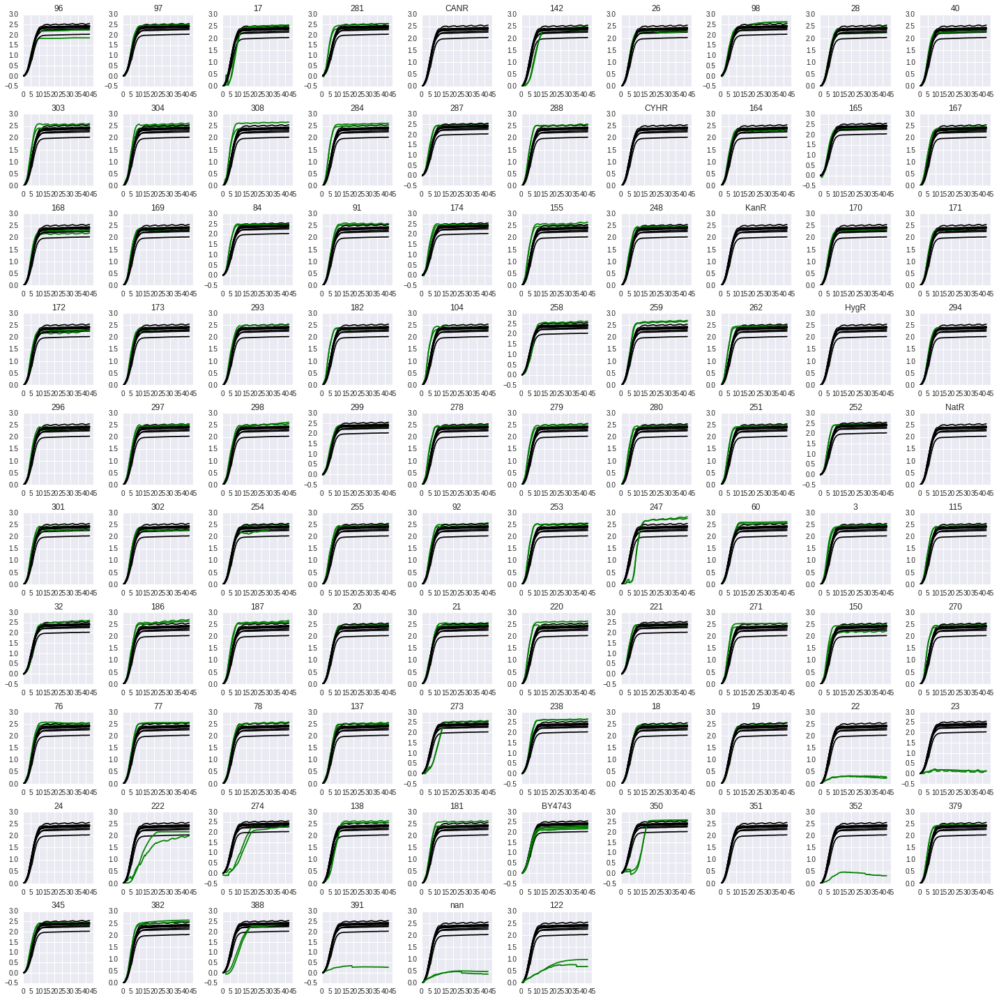

In [81]:
plt.figure(figsize=(20,20))

for i,m in enumerate(mutants):
    
    plt.subplot(10,10,i+1)
    
    select = (meta.Condition==control) & (meta.strain.isin([parent,m]))
    
    plotSamples(data.loc[:,meta.index[select]].values,data.index,
            colors=['k' if x==parent else 'g' for x in meta.strain[select].tolist()])
    plt.title(m)
    
plt.tight_layout()
plt.savefig("figures/ypd.pdf",bbox_inches="tight")

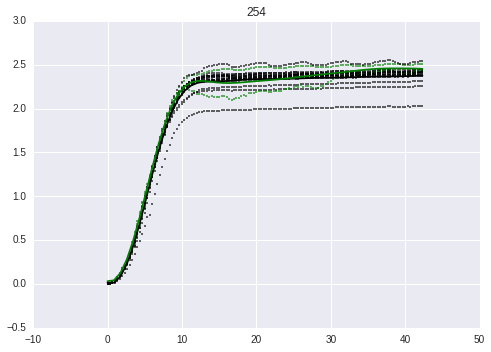

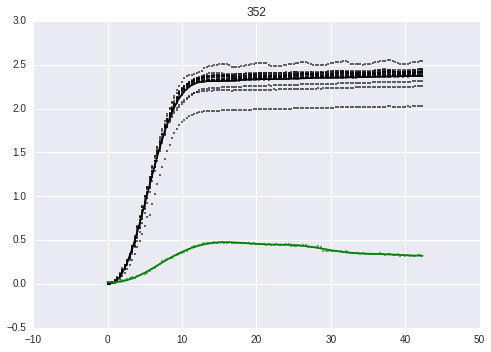

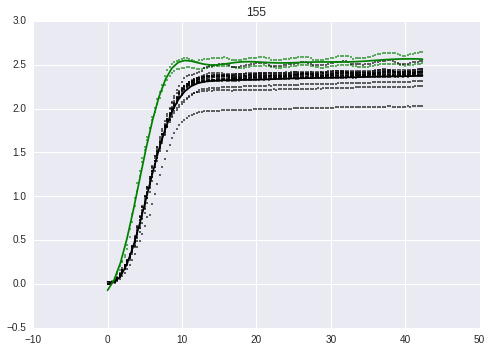

In [110]:
testStrains = ['254','352','155']

predx = np.zeros((50,2))
predx[:,0] = np.linspace(data.index.min(),data.index.max())

for m in testStrains:
    select = (meta.Condition==control) & (meta.strain.isin([parent,m]))
    
    temp = data.loc[:,meta.index[select]]
    temp2 = meta.loc[select,:]
    pivot = pd.concat((temp2,temp.T),1)
    
    tidy = pd.melt(pivot,id_vars=meta.columns.tolist(),value_vars=data.index.tolist(),
        value_name='OD',var_name='time')
    
    x = tidy[['time','strain']]
    x.strain = (x.strain!=parent).astype(int)
    y = tidy.OD.values[:,None]
    k = GPy.kern.RBF(2,ARD=True)
    gp = GPy.models.GPRegression(x,y,k)
    gp.optimize()
    
    plt.figure()
    plt.title(m)
    predx[:,1] = 0
    mu,_ = gp.predict(predx)
    plt.plot(predx[:,0],mu,c='k')
    
    predx[:,1] = 1
    mu,_ = gp.predict(predx)
    plt.plot(predx[:,0],mu,c='g')
    
    plotSamples(data.loc[:,meta.index[select]].values,data.index,
            colors=['k' if x==parent else 'g' for x in meta.strain[select].tolist()],
               plotMethod=plt.scatter,s=2)

## Permutation 

In [155]:
def tidyfy(pivot):
    return pd.melt(pivot,id_vars=meta.columns.tolist(),value_vars=data.index.tolist(),
        value_name='OD',var_name='time')

In [111]:
# def permTest(x,y,nullLoglikelihood,numPerm=10,permCol=1):
#     perms =[]
#     for i in range(numPerm):
#         x[:,1] = np.random.choice(x[:,1],size=x.shape[0],replace=False)
#         k = GPy.kern.RBF(2,ARD=True)
#         gp = GPy.models.GPRegression(x,y,k)
#         gp.optimize()
#         perms.append(gp.log_likelihood()-nullLoglikelihood)
        
#     return perms

In [233]:
def permTest(pivot,nullLoglikelihood,numPerm=10,permCol='strain',colTransform={}):
    pivot = pivot.copy()
    perms = []
    for i in range(numPerm):
        pivot[permCol] = np.random.choice(pivot[permCol],size=pivot.shape[0],replace=False)
        tidy = tidyfy(pivot)
        
        for k in colTransform.keys():
            tidy[k] = colTransform[k](tidy)
        
        timeSelect = tidy.time.unique()[::3]
        tidy = tidy[tidy.time.isin(timeSelect)]

        x = tidy[['time','strain']]
        x.strain = (x.strain!=parent).astype(int)
        x = x.values
        y = tidy.OD.values[:,None]
        k = GPy.kern.RBF(2,ARD=True)
        
        gp = GPy.models.GPRegression(x,y,k)
        gp.optimize()
        perms.append(gp.log_likelihood()-nullLoglikelihood)
        
    return perms


In [135]:
results = {}

for m in testStrains:
    select = (meta.Condition==control) & (meta.strain.isin([parent,m]))
    
    temp = data.loc[:,meta.index[select]]
    temp2 = meta.loc[select,:]
    pivot = pd.concat((temp2,temp.T),1)
    
    tidy = pd.melt(pivot,id_vars=meta.columns.tolist(),value_vars=data.index.tolist(),
        value_name='OD',var_name='time')
    
    timeSelect = tidy.time.unique()[::3]
    tidy = tidy[tidy.time.isin(timeSelect)]
    
    x = tidy[['time','strain']]
    x.strain = (x.strain!=parent).astype(int)
    x = x.values
    y = tidy.OD.values[:,None]
    k = GPy.kern.RBF(2,ARD=True)
    gp = GPy.models.GPRegression(x,y,k)
    gp.optimize()
    
    altLoglikelihood = gp.log_likelihood()
    
    xnull = tidy.time.values[:,None]
    y = tidy.OD.values[:,None]
    k = GPy.kern.RBF(1)
    gp = GPy.models.GPRegression(xnull,y,k)
    gp.optimize()

    nullLoglikelihood = gp.log_likelihood()
    actualBf = altLoglikelihood - nullLoglikelihood

    #perms = permTest(x,y,nullLoglikelihood,numPerm=10)
    perms = permTest(pivot,nullLoglikelihood,numPerm=10)
    
    results[m] = (actualBf,perms)
    #print m, actualBf, perms

254 5.26810133547 [-4.08122900807939e-06, -0.0015837487533190142, -0.0045433589189087797, 0.37435893540271081, -6.5739795900299214e-06, 0.054259294814528403, 1.6911823957301522, 0.0033809785716130136, 0.19977593744488331, 0.084649830299895257]
352 914.451093451 [-0.0010066809460340664, -0.00053069607344014003, -8.306454560624843e-06, -3.0334737175508053e-06, -3.8292325257316406e-06, 0.77941846875683041, 0.91680873962548048, -5.1155254823243013e-06, 0.014388061172553535, 4.424088781652415]
155 181.903229812 [0.22653935976290995, 0.0037875328390555296, -9.120837819409644e-05, -0.00012600401191775745, 0.074466625947025022, 0.0097314386612765702, 1.0817737150725293, -2.5198401942816417e-05, 0.11002928400682777, -0.002907365870328249]


In [187]:
def getData(select,fmt='standard'):
    temp = data.loc[:,meta.index[select]]
    temp2 = meta.loc[select,:]
    
    if fmt == 'standard':
        return temp,temp2
    pivot = pd.concat((temp2,temp.T),1)    
    if fmt == 'pivot':
        return pivot
    
    tidy = pd.melt(pivot,id_vars=meta.columns.tolist(),value_vars=data.index.tolist(),
        value_name='OD',var_name='time')
    
    return tidy

In [157]:
def runTest(m,numPerm=10,timeThin=3):
    select = (meta.Condition==control) & (meta.strain.isin([parent,m]))
    
    temp = data.loc[:,meta.index[select]]
    temp2 = meta.loc[select,:]
    pivot = pd.concat((temp2,temp.T),1)
    
    tidy = pd.melt(pivot,id_vars=meta.columns.tolist(),value_vars=data.index.tolist(),
        value_name='OD',var_name='time')
    
    timeSelect = tidy.time.unique()[::timeThin]
    tidy = tidy[tidy.time.isin(timeSelect)]
    
    x = tidy[['time','strain']]
    x.strain = (x.strain!=parent).astype(int)
    x = x.values
    y = tidy.OD.values[:,None]
    k = GPy.kern.RBF(2,ARD=True)
    gp = GPy.models.GPRegression(x,y,k)
    gp.optimize()
    
    altLoglikelihood = gp.log_likelihood()
    
    xnull = tidy.time.values[:,None]
    y = tidy.OD.values[:,None]
    k = GPy.kern.RBF(1)
    gp = GPy.models.GPRegression(xnull,y,k)
    gp.optimize()

    nullLoglikelihood = gp.log_likelihood()
    actualBf = altLoglikelihood - nullLoglikelihood

    perms = permTest(pivot,nullLoglikelihood,numPerm=numPerm)
    
    return actualBf, perms

In [171]:
actualBF,perms = runTest("254",numPerm=20)
actualBF,perms

(5.2681013354729203,
 [5.0090476944601505,
  1.0002142174342907,
  2.4450050859834391,
  9.7884677891943284,
  115.70493736762705,
  6.2602730300764051,
  74.934580594533031,
  24.749189414118518,
  0.04316717045844598,
  0.008689157323146901,
  16.215453007630686,
  1.743458741105087,
  15.548594871054092,
  1.0002142174342907,
  2.1190576427761698,
  26.676811369969528,
  -4.6013904011488194e-06,
  -1.0883018831009394e-05,
  0.13748620716739879,
  0.13748620716739879])

In [173]:
results = {}

for m in testStrains:
    print m
    results[m] = runTest(m,numPerm=10)

254
352
155


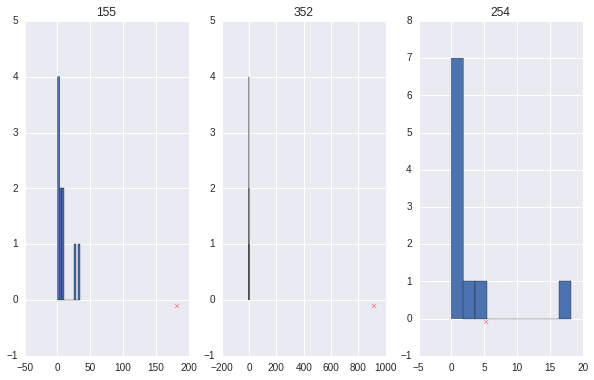

In [176]:
plt.figure(figsize=(10,6))
for i,k in enumerate(results.keys()):
    plt.subplot(1,len(results.keys()),i+1)
    plt.title(k)
    plt.hist(results[k][1])
    plt.scatter(results[k][0],-.1,color='r',marker='x')

In [213]:
numPerm = 20
for m in mutants:
    if m in results:
        if len(results[m][1]) < numPerm:
            print m
            results[m][1].extend(runTest(m,numPerm-len(results[m][1]))[1])
        continue
    
    print m
    results[m] = runTest(m,numPerm=numPerm)    

96
97
17
281
CANR
142
26
98
28
40
303
304
308
284
287
288
CYHR
164
165
167
168
169
84
91
174
155
248
KanR
170
171
172
173
293
182
104
258
259
262
HygR
294
296
297
298
299
278
279
280
251
252
NatR
301
302
254
255
92
253
247
60
3
115
32
186
187
20
21
220
221
271
150
270
76
77
78
137
273
238
18
19
22
23
24
222
274
138
181
BY4743
350
351
352
379
345
382
388
391
nan
122


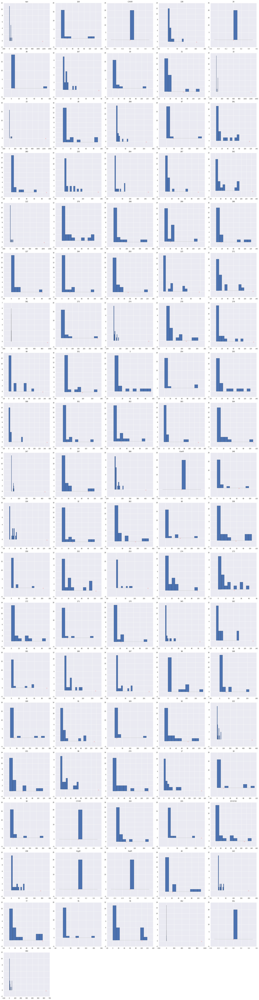

In [214]:
keys = results.keys()

plt.figure(figsize=(25,len(keys)))
for i,k in enumerate(keys):
    # a,perm = results[k]
    plt.subplot(len(keys)/5+1,5,i+1)
    plt.title(k)
    plt.hist(results[k][1])
    plt.scatter(results[k][0],-.2,color='r',marker='x',s=50)
    
plt.tight_layout()
plt.savefig("figures/bayesFactors.pdf",bbox_inches='tight')

In [215]:
from mpl_toolkits.axes_grid.inset_locator import inset_axes

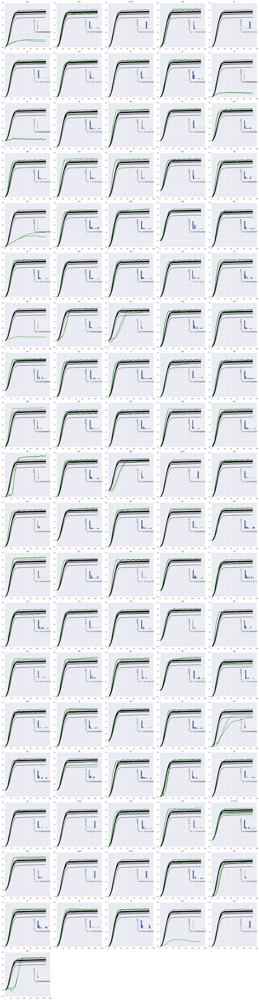

In [216]:
keys = results.keys()

plt.figure(figsize=(25,len(keys)))
for i,k in enumerate(keys):
    # a,perm = results[k]
    temp,temp2 = getData((meta.Condition==control) & (meta.strain.isin([parent,k])))
    
    a = plt.subplot(len(keys)/5+1,5,i+1)
    plt.title(k)
    plotSamples(temp.values,colors=['k' if x==parent else 'g' for x in temp2.strain.tolist()])
    
    ia = inset_axes(a,
                    width="30%", # width = 30% of parent_bbox
                    height=1., # height : 1 inch
                    loc=7)
    
    #a = plt.axes([.65, .6, .2, .2], axisbg='y')
    ia.hist(results[k][1])
    ia.scatter(results[k][0],-.2,color='r',marker='x',s=50)
    
plt.tight_layout()
plt.savefig("figures/dataAndBayesFactors.pdf",bbox_inches='tight')

In [217]:
meta.Condition.unique()

array(['Rapamycin 1\xc2\xb5g/ml', 'Anisomycin 0.5\xc2\xb5g/ml',
       'Maltose 8%', 'Melibiose 2%', 'Nickel 0.375mM', 'Glucose 0.5%',
       'Caffeine 2.25mg/ml', 'Glycerol 2%', 'Hydroxyurea 15mg/ml',
       'Galactose 2%', 'CdCl2 100\xc2\xb5M', 'Copper chloride 0.75mM',
       'Trifluoperazine 50\xc2\xb5M', 'Glucose 8%', 'Arabinose 2%',
       'Mannose 2%', 'Paraquat 250\xc2\xb5g/ml', 'pH 7',
       'Ethanol (stress) 7%', 'Hydroxyurea 10mg/ml',
       'Cisplatin 100\xc2\xb5g/ml', 'Paramomycin 10mg/ml', 'MMS 0.01%',
       'Ethanol (stress) 13%', 'Cykloheximide 0.05\xc2\xb5g/ml',
       'MMS 0.005%', 'LiCl 225mM', 'Tunicamycin 1\xc2\xb5g/ml',
       'Cupper chloride 0.375mM', 'Paraquat 400\xc2\xb5g/ml',
       'Cykloheximide 0.1\xc2\xb5g/ml', 'Methionine depletion',
       'Ethanol (glucose replacement 2%)', 'Raffinose 2%',
       'Synthetic wine must 2%', '1,2,4-Aminotriazole (AT-3) 300mM',
       'KCl 2M', 'Glucose 1%', 'pH 3.5', 'CdCl2 150\xc2\xb5M',
       'Cobalt chloride 0.015mM

## Paraquat 

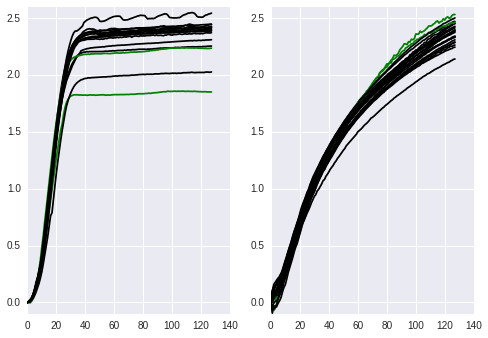

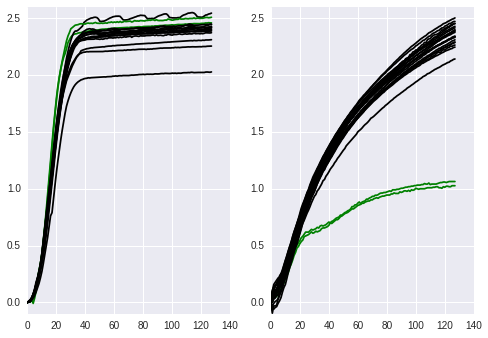

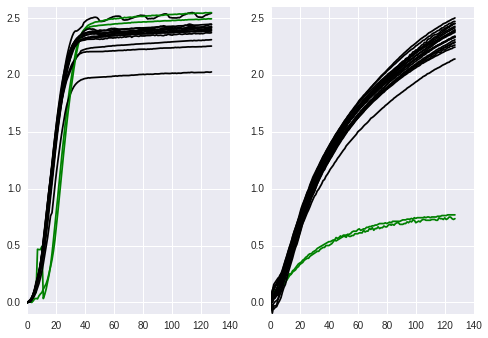

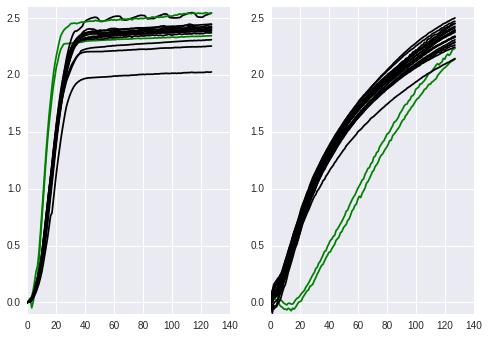

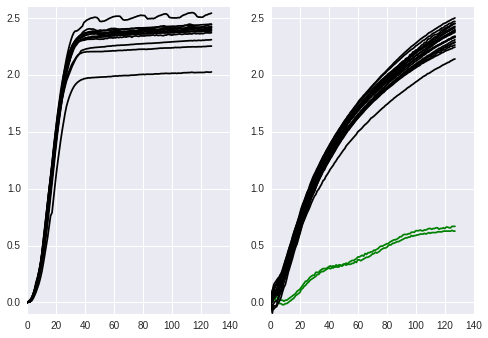

...

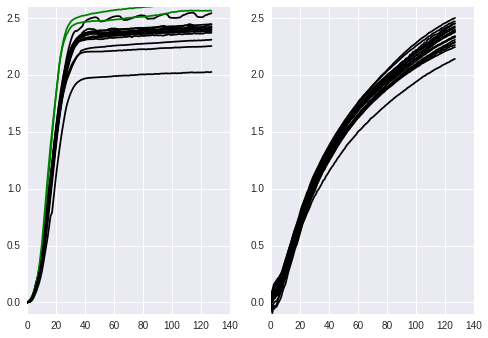

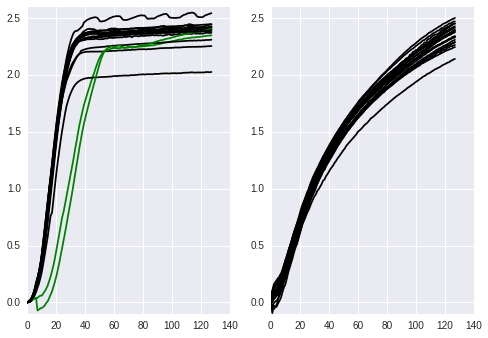

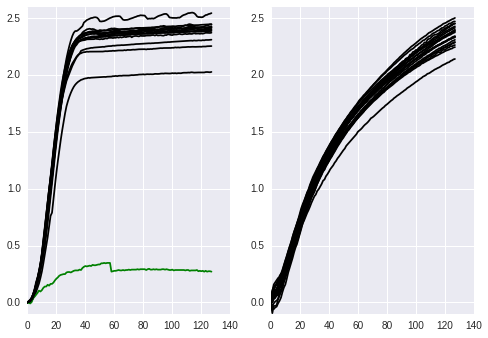

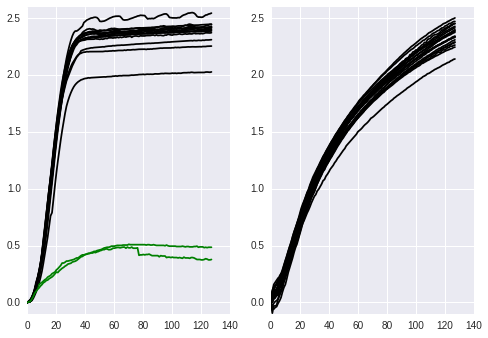

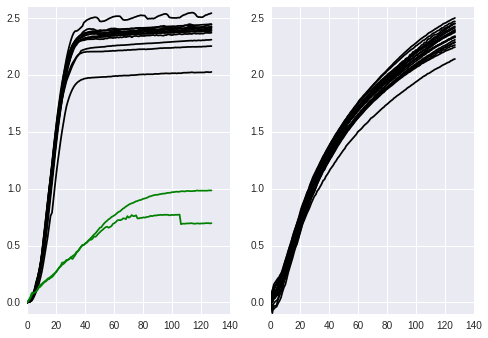

In [345]:
condition = 'Paraquat 400\xc2\xb5g/ml'
conditionDir = condition.replace("/",'-')

if not condition in os.listdir('figures'):
    os.mkdir(os.path.join('figures',conditionDir))

for m in mutants:
    temp,temp2 = getData(((meta.Condition==control) | (meta.Condition==condition)) & (meta.strain.isin([parent,m])))
    
    plt.figure()
    plt.subplot(121)
    plotSamples(temp.values[:,np.where(temp2.Condition==control)[0]],
                colors=['k' if x==parent else 'g' for x in temp2[temp2.Condition==control].strain.tolist()])
    plt.ylim(-.1,2.6)

    plt.subplot(122)
    plotSamples(temp.values[:,np.where(temp2.Condition!=control)[0]],
                colors=['k' if x==parent else 'g' for x in temp2[temp2.Condition!=control].strain.tolist()])
    plt.ylim(-.1,2.6)
    plt.savefig("figures/%s/%s.pdf"%(conditionDir,m),bbox_inches='tight')

In [351]:
numPerm = 20
resultsParaquat = {}

for m in mutants:
    select = ((meta.Condition==control) | (meta.Condition==condition)) & (meta.strain.isin([parent,m]))
    if m in resultsParaquat:
        if len(resultsParaquat[m][1]) < numPerm:
            print m
            resultsParaquat[m][1].extend(runTest(select,timeThin=10,
                dims=['condition','interaction'],nullDim='interaction',
                numPerm=numPerm-len(results[m][1]))[1])
        continue
    
    print m
    resultsParaquat[m] = runTest(select,timeThin=10,
                dims=['condition','interaction'],nullDim='interaction',
                numPerm=numPerm)

96
97
17
281
CANR
142
26
98
28
40
303
304
308
284
287
288
CYHR
164
165
167
168
169
84
91
174
155
248
KanR
170
171
172
173
293
182
104
258
259
262
HygR
294
296
297
298
299
278
279
280
251
252
NatR
301
302
254
255
92
253
247
60
3
115
32
186
187
20
21
220
221
271
150
270
76
77
78
137
273
238
18
19
22
23
24
222
274
138
181
BY4743
350
351
352
379
345
382
388
391
nan
122


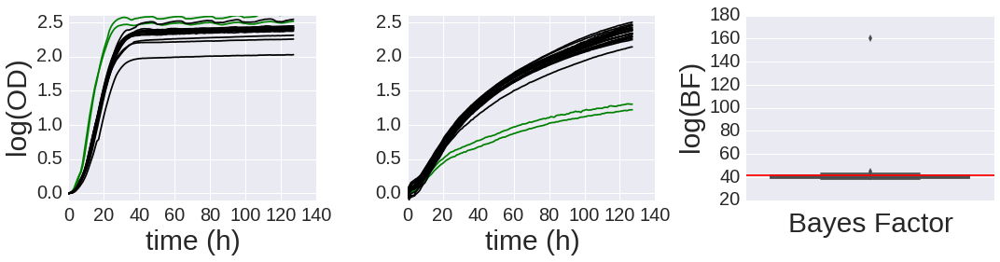

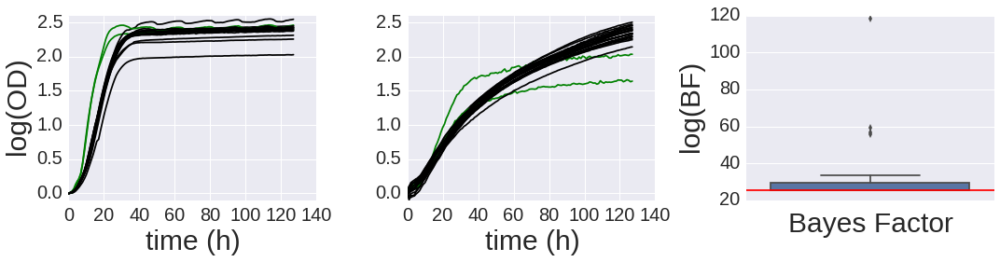

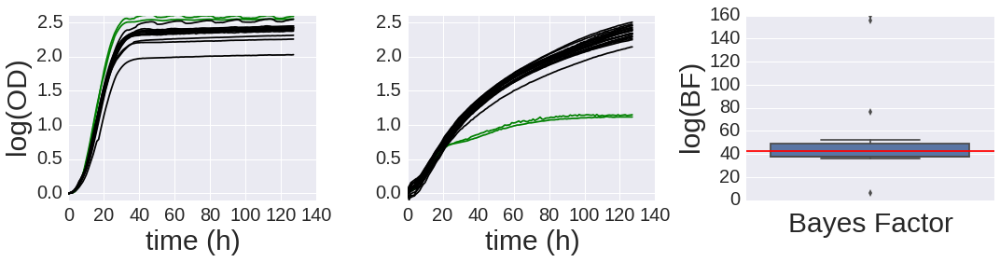

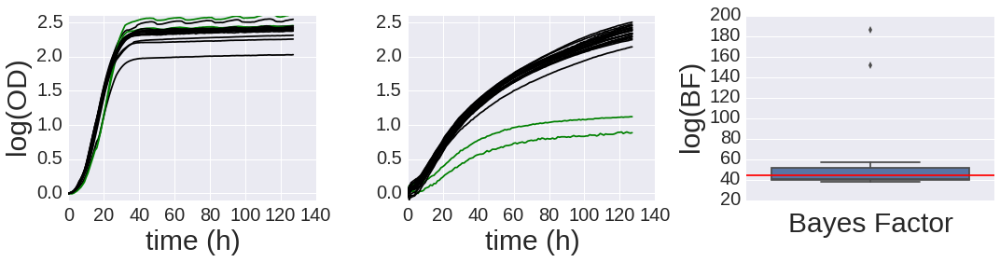

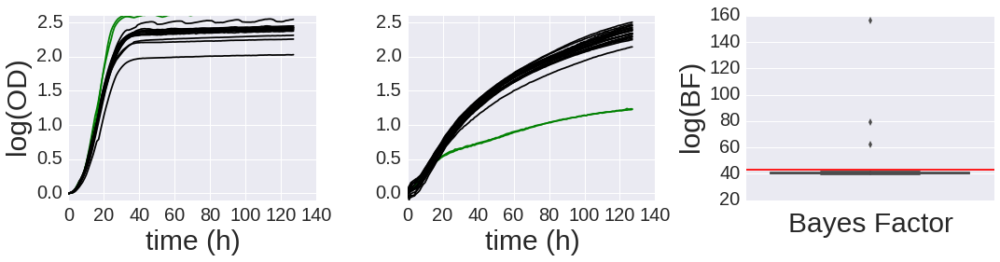

...

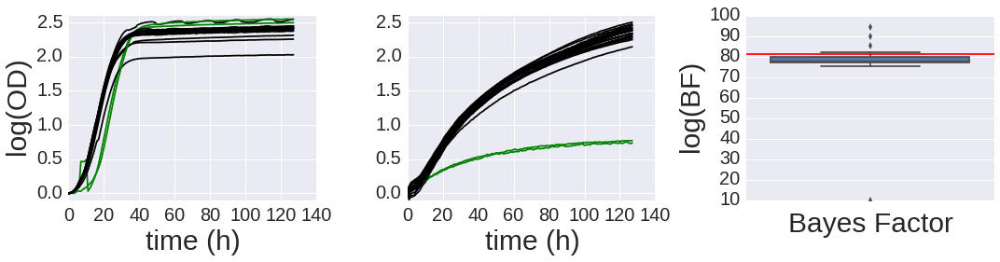

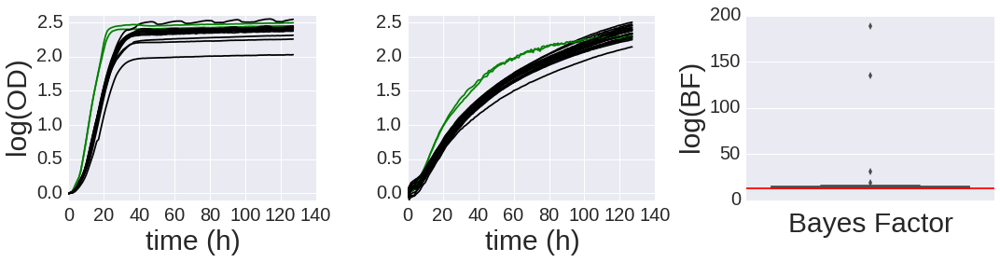

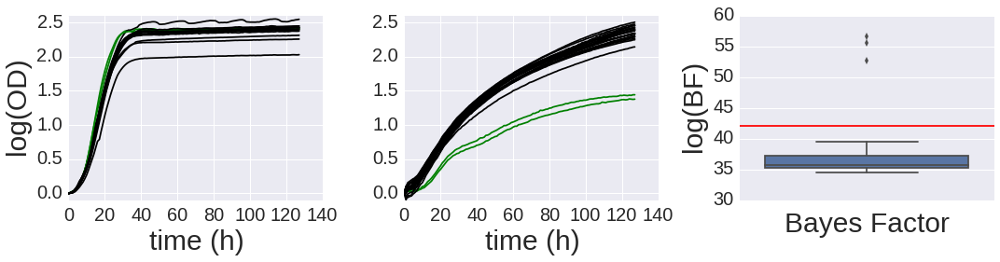

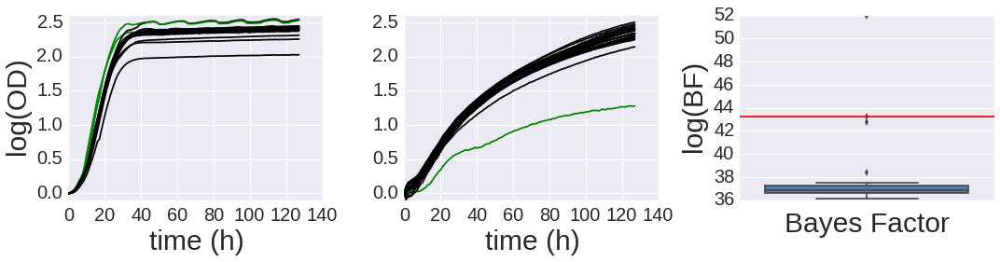

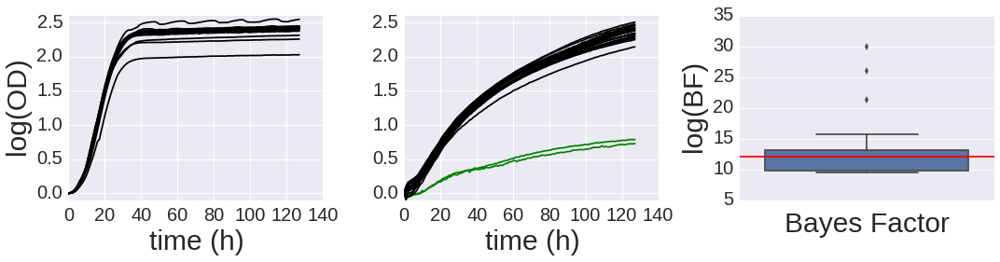

In [424]:
# keys = resultsParaquat.keys()

# plt.figure(figsize=(25,len(keys)))
for i,k in enumerate(keys):
    select = ((meta.Condition==control) | (meta.Condition==condition)) & (meta.strain.isin([parent,k]))
    temp,temp2 = getData(select)
    
    plt.figure(figsize=(15,4))
    plt.subplot(131)
    plt.ylabel("log(OD)",fontsize=30)
    plt.xlabel("time (h)",fontsize=30)
    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20)
    plotSamples(temp.values[:,np.where(temp2.Condition==control)[0]],
                colors=['k' if x==parent else 'g' for x in temp2[temp2.Condition==control].strain.tolist()])
    plt.ylim(-.1,2.6)

    plt.subplot(132)
    plt.xlabel("time (h)",fontsize=30)
    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20)
    plotSamples(temp.values[:,np.where(temp2.Condition!=control)[0]],
                colors=['k' if x==parent else 'g' for x in temp2[temp2.Condition!=control].strain.tolist()])
    plt.ylim(-.1,2.6)
    
    ia = plt.subplot(133)
    plt.ylabel("log(BF)",fontsize=30)
    plt.xlabel("Bayes Factor",fontsize=30)
    plt.yticks(fontsize=20)
    sns.boxplot(resultsParaquat[k][1],ax=ia,orient='v')
    ia.plot([-1,1],[resultsParaquat[k][0],resultsParaquat[k][0]],color='r')
#     ia.hist(resultsParaquat[k][1])
#     ia.scatter(resultsParaquat[k][0],-.2,color='r',marker='x',s=50)
    
    plt.tight_layout()
    plt.savefig("figures/%s/%s-bayesFactor.pdf"%(conditionDir,k),bbox_inches='tight')
    
#     break

In [406]:
sns.boxplot()

41.624070218662723

In [394]:
def buildTable(results):
    
    ret = pd.DataFrame()
    
    for k in results.keys():
        row = pd.Series(results[k],name=k,index=['actual','permuted'])
        ret = pd.concat((ret,row),1,ignore_index=False)
        
    ret = ret.T
    ret['FDR'] = ret.apply(lambda x: 1.*sum(x['actual']<=x['permuted'])/len(x['permuted']),1)
    ret = ret.sort_index(by='FDR')

    return ret

In [398]:
t = buildTable(resultsParaquat)
# t.sort('FDR',ascending=True)
# t = t.T
# t.head()
t.head(sum(t.FDR<=.2))

,actual,permuted,FDR
165,45.86362,"[43.0236419083, 40.0767762534, 37.3766963025, ...",0.00
21,50.00568,"[43.6221079402, 40.9171065342, 40.3559059625, ...",0.00
254,104.7374,"[103.876836135, 88.4057836249, 93.3290405198, ...",0.05
60,103.8271,"[146.530946745, 96.5127916566, 22.7025710346, ...",0.05
26,46.51992,"[39.8247333388, 36.4588676428, 35.4484098823, ...",0.05
287,45.30726,"[32.3884436222, 32.790438159, 41.5327046488, 4...",0.05
32,107.0891,"[93.4465183191, 108.086435846, 92.4801468053, ...",0.10
171,43.60172,"[34.2258487247, 40.1462726885, 36.1770446874, ...",0.10
252,40.59263,"[25.4497129524, 25.8926648559, 39.7783094122, ...",0.10
293,43.24255,"[36.8354069179, 36.1125032101, 36.6121328318, ...",0.10


In [401]:
sig = t[t.FDR<=.2]

meta[meta.strain.isin(sig.index)].Strain.unique()

array(['97 (cerevisiae, Y55, France, Wine)',
       '142 (paradoxus, CBS432, Russia, Oak)',
       '26 (paradoxus, N-17, Russia, Oak)',
       '28 (paradoxus, DBVPG4650, Italy, Guano)',
       '40 (paradoxus, T21.4, London, UK, Oak)',
       '287 (cerevisiae, 378604X, RVI, Newcaslte UK, Clinical isolate (Sputum))',
       '164 (paradoxus, Y7, London, UK, Oak)',
       '165 (paradoxus, Y6.5, London, UK, Oak)',
       '169 (paradoxus, Q62.5, London, UK, Oak)',
       '155 (cerevisiae, DBVPG6040, Netherland, Fermenting fruit juice)',
       '170 (paradoxus, Q89.8, London, UK, Oak)',
       '171 (paradoxus, Q95.3, London, UK, Oak)',
       '173 (paradoxus, Z1.1, London, UK, Oak)',
       '293 (paradoxus, Y9.6, London, UK, Oak)',
       '259 (cerevisiae, YS4, Netherland, Baker strain)',
       '294 (paradoxus, Q74.4, London, UK, Oak)',
       '296 (paradoxus, Q96.8, London, UK, Oak)',
       '298 (paradoxus, Q31.4, London, UK, Oak)',
       '252 (cerevisiae, Y9  , Japan, Ragi (similar to sa

In [342]:
m = mutants[1]

In [343]:
condition = 'Paraquat 400\xc2\xb5g/ml'
temp,temp2 = getData(((meta.Condition==control) | (meta.Condition==condition)) & (meta.strain.isin([parent,m])))

(-0.1, 2.6)

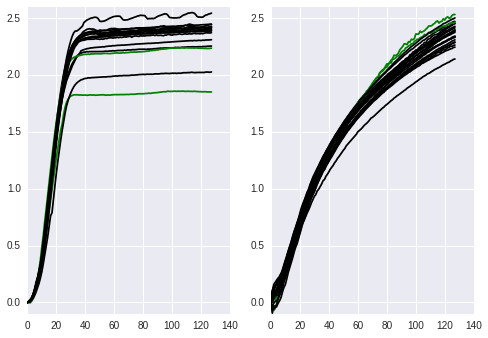

In [333]:
plt.subplot(121)
plotSamples(temp.values[:,np.where(temp2.Condition==control)[0]],
            colors=['k' if x==parent else 'g' for x in temp2[temp2.Condition==control].strain.tolist()])
plt.ylim(-.1,2.6)

plt.subplot(122)
plotSamples(temp.values[:,np.where(temp2.Condition!=control)[0]],
            colors=['k' if x==parent else 'g' for x in temp2[temp2.Condition!=control].strain.tolist()])
plt.ylim(-.1,2.6)

In [334]:
def permTest(pivot,nullLoglikelihood,numPerm=10,permCol='strain-regression',dims=[],colTransform={},timeThin=3,timeSelect=None):
    pivot = pivot.copy()
    perms = []
    
    for i in range(numPerm):
        pivot[permCol] = np.random.choice(pivot[permCol],size=pivot.shape[0],replace=False)
        tidy = tidyfy(pivot)
        
        #timeSelect = tidy.time.unique()[::timeThin]
        if not timeSelect is None:
            tidy = tidy[tidy.time.isin(timeSelect)]

        #_dims = ['time','strain-regression']+dims
        _dims = dims
        
        x = tidy[_dims]
        #x.strain = (x.strain!=parent).astype(int)
        for k in colTransform.keys():
            x[k] = colTransform[k](x)
        x = x.values
        
        y = tidy.OD.values[:,None]
        k = GPy.kern.RBF(x.shape[1],ARD=True)
        
        gp = GPy.models.GPRegression(x,y,k)
        gp.optimize()
        perms.append(gp.log_likelihood()-nullLoglikelihood)
        
    return perms

In [339]:
def runTest(select,numPerm=10,timeThin=3,dims=[],nullDim='strain-regression',colTransform={}):
    #select = (meta.Condition==control) & (meta.strain.isin([parent,m]))
    
    temp = data.loc[:,meta.index[select]]
    temp2 = meta.loc[select,:]
    pivot = pd.concat((temp2,temp.T),1)
    
    #tidy = pd.melt(pivot,id_vars=meta.columns.tolist(),value_vars=data.index.tolist(),
    #    value_name='OD',var_name='time')
    tidy = tidyfy(pivot)
    
    timeSelect = tidy.time.unique()[::timeThin]
    tidy = tidy[tidy.time.isin(timeSelect)]
    
    dims = ['time','strain-regression']+dims
    
    x = tidy[dims]
    # x.strain = (x.strain!=parent).astype(int)
    x = x.values
    y = tidy.OD.values[:,None]
    k = GPy.kern.RBF(x.shape[1],ARD=True)
    gp = GPy.models.GPRegression(x,y,k)
    gp.optimize()
    
    altLoglikelihood = gp.log_likelihood()
    
    _dims = [d for d in dims]
    _dims.remove(nullDim)
    
    xnull = tidy[_dims]
    if xnull.shape[1] == 1:
        xnull = xnull[:,None]
    #if 'strain' in dims:
    #    xnull.strain = (xnull.strain!=parent).astype(int)
    xnull = xnull.values
        
    y = tidy.OD.values[:,None]
    k = GPy.kern.RBF(xnull.shape[1])
    gp = GPy.models.GPRegression(xnull,y,k)
    gp.optimize()

    nullLoglikelihood = gp.log_likelihood()
    actualBf = altLoglikelihood - nullLoglikelihood

    perms = permTest(pivot,nullLoglikelihood,
                     #permCol='strain-regression',numPerm=numPerm,
                     permCol=nullDim,numPerm=numPerm,
                     dims=dims,colTransform=colTransform,
                     timeSelect=timeSelect)
    
    return actualBf, perms

In [336]:
# permTest(pivot,0,1,dims=['condition','conditionInteraction'],colTransform={'conditionInteraction':lambda x: x['strain']*x['condition']})

In [338]:
a,perm = runTest(((meta.Condition==control) | (meta.Condition==condition)) & (meta.strain.isin([parent,m])),timeThin=10,
                dims=['condition','interaction'],nullDim='interaction',
                colTransform={'interaction':lambda x: x['strain-regression']*x['condition']},
                numPerm=10)

a,perm

 /home/ptonner/dev/gp_growth_phenotype/lib/python2.7/site-packages/IPython/kernel/__main__.py:19: SettingWithCopyWarning:
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


(28.367842078525427,
 [-15.485247845934055,
  -49.68683526689415,
  51.048098650214797,
  -49.098679238751515,
  -16.499371475801752,
  -48.428615204415053,
  -49.686833635646735,
  -48.490746301368915,
  -46.357563692583767,
  -49.686841956360354])

In [341]:
a,perm = runTest(((meta.Condition==control) | (meta.Condition==condition)) & (meta.strain.isin([parent,m])),timeThin=10,
                dims=['condition','interaction'],nullDim='interaction',
                #colTransform={'interaction':lambda x: x['strain-regression']*x['condition']},
                numPerm=10)

a,perm

(28.367842078525427,
 [59.842685445210805,
  28.301503164886412,
  60.396840282662708,
  28.367869676674047,
  28.117476022255687,
  27.61556815856693,
  70.408819691492567,
  31.160730613799785,
  117.04347714071162,
  28.367870283287687])

In [241]:
temp,temp2 = getData(((meta.Condition==control) | (meta.Condition==condition)) & (meta.strain.isin([parent,m])))

In [244]:
pivot = pd.concat((temp2,temp.T),1)
    
tidy = tidyfy(pivot)

In [245]:
pivot.head()

,Strain,Position,Abb,Condition,Experiment,Set,strain,conditionInteraction,condition,0.0,...,39.3333333333,39.6666666667,40.0,40.3333333333,40.6666666667,41.0,41.3333333333,41.6666666667,42.0,42.3333333333
6358,BY4741 (cerevisiae),5,PP,Paraquat 400µg/ml,ppgs0401,1,BY4741,False,True,0,...,2.277338,2.285402,2.291821,2.298212,2.304575,2.314066,2.317216,2.323495,2.328187,2.331306
6380,BY4741 (cerevisiae),27,PP,Paraquat 400µg/ml,ppgs0401,1,BY4741,False,True,0,...,2.398242,2.394860,2.410019,2.416706,2.425022,2.426679,2.439869,2.446420,2.451313,2.452940
6422,BY4741 (cerevisiae),71,PP,Paraquat 400µg/ml,ppgs0401,1,BY4741,False,True,0,...,2.350497,2.355481,2.365396,2.373607,2.381772,2.386649,2.396353,2.401181,2.410788,2.415568
6439,BY4741 (cerevisiae),88,PP,Paraquat 400µg/ml,ppgs0401,1,BY4741,False,True,0,...,2.377070,2.387849,2.393209,2.405639,2.416208,2.419714,2.431918,2.437117,2.449175,2.454313
6441,BY4741 (cerevisiae),90,PP,Paraquat 400µg/ml,ppgs0401,1,BY4741,False,True,0,...,2.415037,2.415037,2.430240,2.436276,2.442288,2.454235,2.454235,2.463132,2.470504,2.471974


In [246]:
permCol = 'strain'
pivot[permCol] = np.random.choice(pivot[permCol],size=pivot.shape[0],replace=False)
tidy = tidyfy(pivot)

In [247]:
tidy.head()

,Strain,Position,Abb,Condition,Experiment,Set,strain,conditionInteraction,condition,time,OD
0,BY4741 (cerevisiae),5,PP,Paraquat 400µg/ml,ppgs0401,1,BY4741,False,True,0,0
1,BY4741 (cerevisiae),27,PP,Paraquat 400µg/ml,ppgs0401,1,BY4741,False,True,0,0
2,BY4741 (cerevisiae),71,PP,Paraquat 400µg/ml,ppgs0401,1,BY4741,False,True,0,0
3,BY4741 (cerevisiae),88,PP,Paraquat 400µg/ml,ppgs0401,1,BY4741,False,True,0,0
4,BY4741 (cerevisiae),90,PP,Paraquat 400µg/ml,ppgs0401,1,BY4741,False,True,0,0


In [248]:
tidy['strain']*tidy['condition']

0       BY4741
1       BY4741
2       BY4741
3       BY4741
4       BY4741
5       BY4741
6       BY4741
7       BY4741
8          122
9       BY4741
10      BY4741
11      BY4741
12      BY4741
13      BY4741
14      BY4741
15      BY4741
16      BY4741
17      BY4741
18      BY4741
19      BY4741
20            
21            
22            
23            
24            
25            
26            
27            
28            
29            
         ...  
4578    BY4741
4579    BY4741
4580       122
4581    BY4741
4582    BY4741
4583    BY4741
4584    BY4741
4585    BY4741
4586    BY4741
4587    BY4741
4588    BY4741
4589    BY4741
4590    BY4741
4591    BY4741
4592          
4593          
4594          
4595          
4596          
4597          
4598          
4599          
4600          
4601          
4602          
4603          
4604          
4605          
4606          
4607          
dtype: object

# Normal growth 

In [177]:
plates = [u'20150715 PQ 8',
 u'20150607 PQ 4',
 u'20150630 PQ 5',
 u'20150717 PQ 9',
 u'20150514 PQ 2',
 u'20150702 PQ 6',
 u'20150704 PQ 7',
 u'20150517 PQ 3']

## Plot data 

VNG2268 20150715 PQ 8
VNG1179 20150715 PQ 8
trmB 20150715 PQ 8
VNG2614 20150715 PQ 8
VNG0194H 20150607 PQ 4
hlx2 20150607 PQ 4
hrg 20150607 PQ 4
rosR 20150607 PQ 4
sirR 20150630 PQ 5
idr1 20150630 PQ 5
troR 20150630 PQ 5
idr2 20150630 PQ 5
phoR 20150717 PQ 9
VNG0195 20150717 PQ 9
ark 20150717 PQ 9
kinA2 20150717 PQ 9
phoU 20150514 PQ 2
VNG1179 20150514 PQ 2
cspD2 20150514 PQ 2
cspD1 20150514 PQ 2
arcR 20150702 PQ 6
birA 20150702 PQ 6
hlx1 20150702 PQ 6
kaiC 20150702 PQ 6
VNG0471 20150704 PQ 7
VNG1029 20150704 PQ 7
prp2 20150704 PQ 7
VNG0039 20150704 PQ 7
trh2 20150517 PQ 3
trh3 20150517 PQ 3
trh4 20150517 PQ 3
asnC 20150517 PQ 3


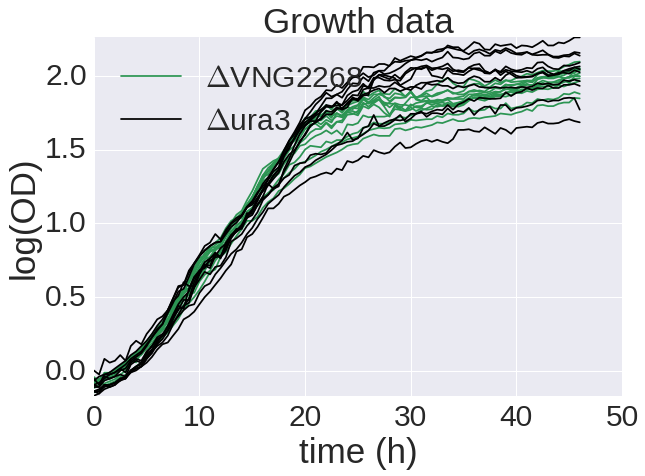

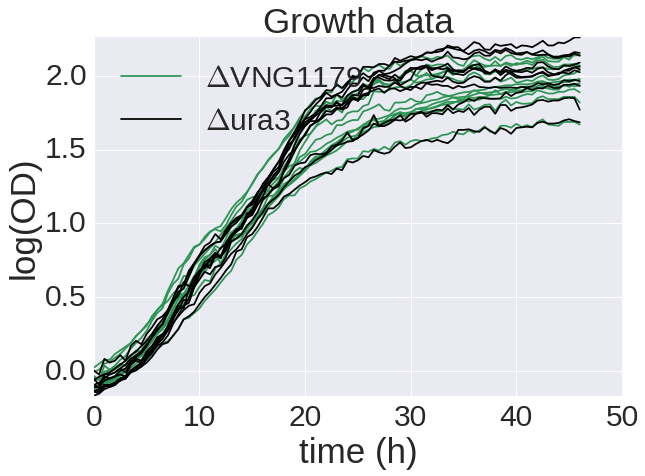

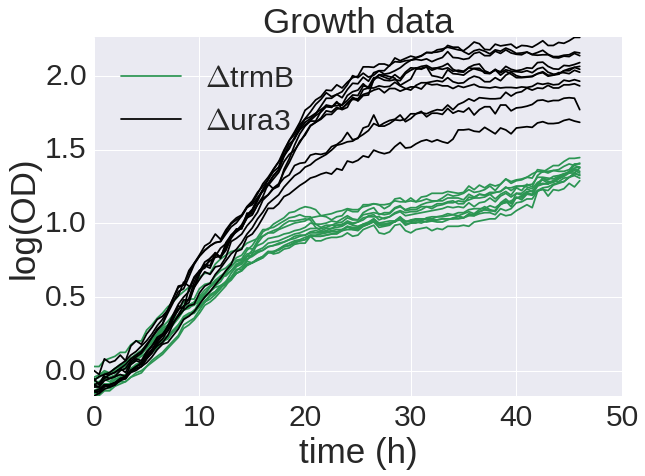

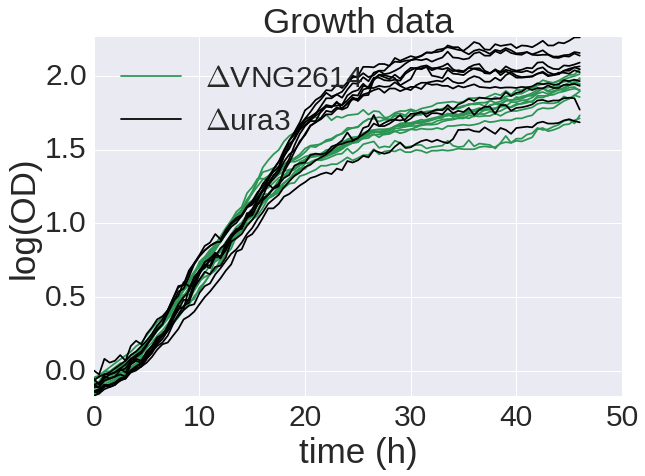

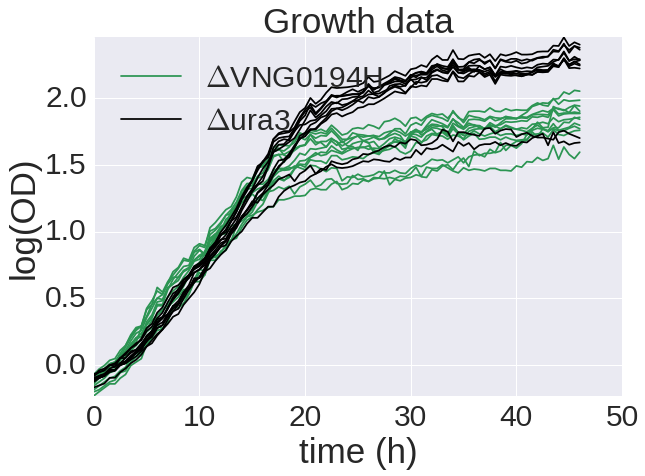

...

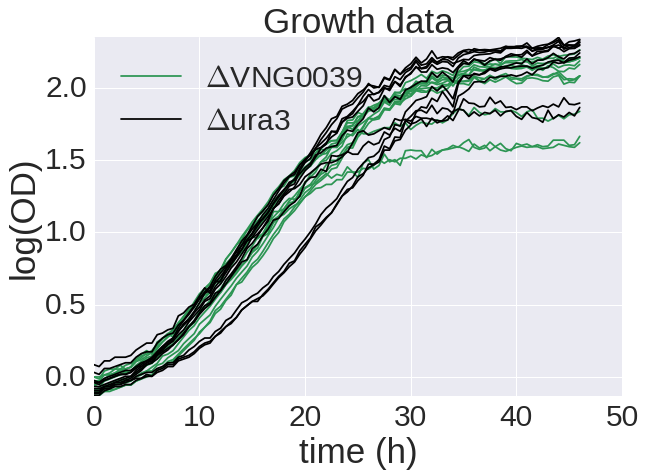

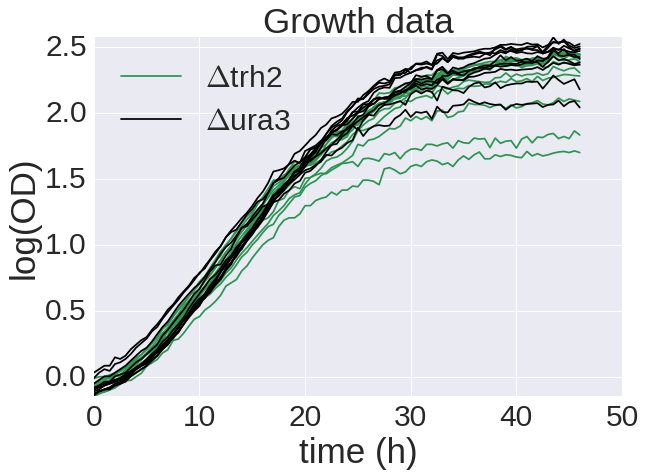

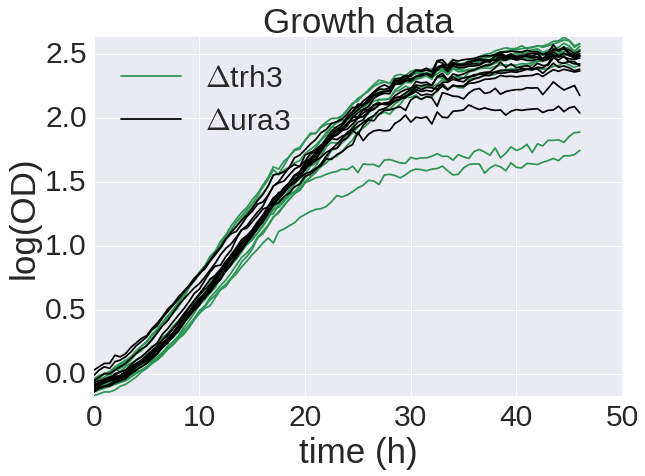

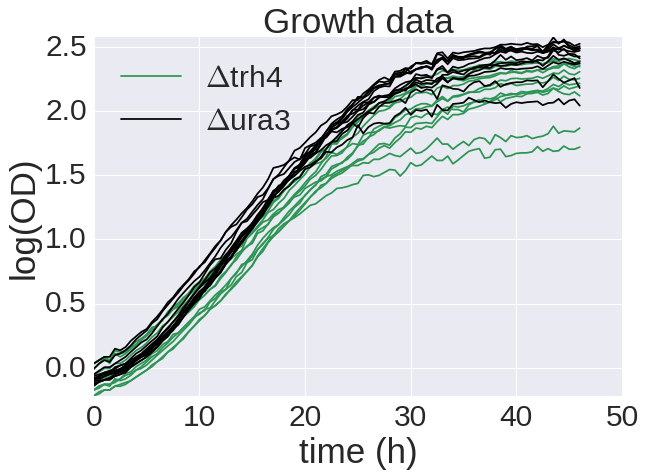

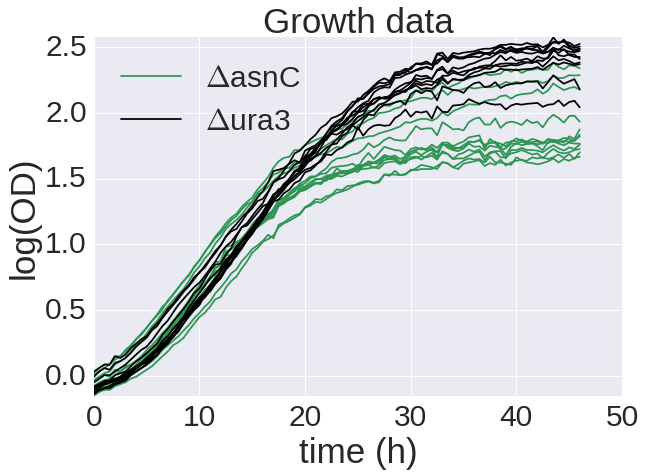

In [179]:
for p in plates:
    strains = db.getExperimentalDesigns("Strain",plate=p)
    for s in strains:
        if s == "ura3" or s == "blank":
            continue
        
        print s,p
        
        data = db.getData(plate=p,Strain=["ura3",s],logged=True,**{'mM PQ':0})
        data.data = data.data.iloc[4:,:]
        data.data.time = data.data.time - data.data.time.values[0]
        data.poly_scale(5,10,groupby=["Strain","mM PQ"])
        
        fig,ax = plt.subplots()
        ylim = (data.data.iloc[:,1:].min().min(),data.data.iloc[:,1:].max().max())
        data.key = data.key.sort("Strain",ascending=s < "ura3")
        data.data.iloc[:,1:] = data.data.iloc[:,data.key.index]
        data.plot(groupby=['plate'],colorby="Strain",newFig=False,useAx=ax,title_index=[],colors=[mutantColor,'k'],legend_kwargs={"fontsize":15})
        plt.ylim(ylim)
        plt.ylabel("log(OD)",fontsize=35)
        plt.yticks(fontsize=30)
        ax.set_title("Growth data",fontsize=35)
        plt.xlabel("time (h)",fontsize=35)
        plt.xticks(fontsize=30)
        
        l = plt.legend(loc="upper left",fontsize=30)
        [t.set_text('$\Delta$'+t.get_text()) for t in l.get_texts()]
        
#         plt.grid(False)
#         plt.grid(True,axis="y",color="k",alpha=.4)
        
        plt.savefig("figures/data/normal_"+s+"_"+p+".png",bbox_inches="tight")

In [36]:
reload(testStatistic)
reload(growth)
reload(mongo)
db = mongo.MongoDB()

In [76]:
# t = np.linspace(0,48)
# conf = []
# intConf = []
# labels = []
# bfs = []
# gp_params = pd.DataFrame()
# gp_null_params = pd.DataFrame()

# for p in plates:
#     strains = db.getExperimentalDesigns("Strain",plate=p)
#     for s in strains:
#         if s == "ura3" or s == "blank":
#             continue
        
#         labels.append((s,p))
#         print s,p
        
#         data = db.getData(plate=p,Strain=["ura3",s],logged=True,**{'mM PQ':0})
#         data.data = data.data.iloc[4:,:]
#         data.data.time = data.data.time - data.data.time.values[0]
#         data.poly_scale(5,10,groupby=["Strain","mM PQ"])
        
#         ts = testStatistic.TestStatistic(data,normalize=False)
        
#         ts_null = testStatistic.TestStatistic(data)
#         ts_null.inputDimensions = ['time']
#         ts_null.k = 1

#         bfs.append(ts.buildGP().log_likelihood()-ts_null.buildGP().log_likelihood())
        
#         gp_params = gp_params.append(pd.DataFrame(gpParams(ts.buildGP()),index=[s]))
#         gp_null_params = gp_null_params.append(pd.DataFrame(gpParams(ts_null.buildGP()),index=[s]))
        
#         diff = ts.computeFullDifference(t)
#         diff = diff.dot(np.diag(np.ones(diff.n))*ts.std)
        
#         conf.append(ts.computeFullConfidence(t))
#         intConf.append(ts.computeIntegralConfidence(t))
        
#         parent = ts.predict(t,function=False)
#         mutant = ts.predict(t,Strain=0,function=False)

#         parent.plot(color=wtColor,label="$OD_p$",alpha=.4)
#         mutant.plot(color=mutantColor,label="$OD_m$",alpha=.4)
#         plt.xlabel("time (h)",fontsize=20)
#         plt.xticks(fontsize=20)
#         plt.ylabel("$OD$",fontsize=25)
#         plt.yticks(fontsize=20)
#         plt.legend(loc="best",fontsize=25)
#         plt.title("Growth Prediction",fontsize=25)
#         plt.savefig("figures/growthPrediction_normal_"+s+"_"+p+".png",bbox_inches="tight")
#         plt.close()
        
        
#         diff.plot(t[1:],color=mutantColor,alpha=.4)
#         plt.plot([t.min(),t.max()],[0,0],'k',linewidth=3)
#         plt.xlabel("time (h)",fontsize=25)
#         plt.xticks(fontsize=20)
#         plt.ylabel("$OD_m - OD_p$",fontsize=25)
#         plt.yticks(fontsize=20)
#         plt.title("Function Difference",fontsize=25)
#         plt.savefig("figures/functionDiff_normal_"+s+"_"+p+".png",bbox_inches="tight")
#         plt.close()


# conf = np.array(conf)
# intConf = np.array(intConf)
# bfs = np.array(bfs)
# labels = pd.DataFrame(labels,columns=['Strain','plate'])

In [180]:
strains = ['sirR','idr1','idr2','rosR','trmB','VNG1179','asnC']

In [181]:
plates = [db.plates.find_one(db.getExperimentalDesigns("plate",Strain=s,plate=plates)[0])['name'] for s in strains]
plates

[u'20150630 PQ 5',
 u'20150630 PQ 5',
 u'20150630 PQ 5',
 u'20150607 PQ 4',
 u'20150715 PQ 8',
 u'20150715 PQ 8',
 u'20150517 PQ 3']

In [182]:
t = np.linspace(0,48)
conf = []
intConf = []
labels = []
bfs = []
gp_params = pd.DataFrame()
gp_null_params = pd.DataFrame()

for p,s in zip(plates,strains):
    
    print s,p

    data = db.getData(plate=p,Strain=["ura3",s],logged=True,**{'mM PQ':0})
    data.data = data.data.iloc[4:,:]
    data.data.time = data.data.time - data.data.time.values[0]
    data.poly_scale(5,10,groupby=["Strain","mM PQ"])

    ts = testStatistic.TestStatistic(data,normalize=False)

    ts_null = testStatistic.TestStatistic(data)
    ts_null.inputDimensions = ['time']
    ts_null.k = 1

    bfs.append(ts.buildGP().log_likelihood()-ts_null.buildGP().log_likelihood())

    gp_params = gp_params.append(pd.DataFrame(gpParams(ts.buildGP()),index=[s]))
    gp_null_params = gp_null_params.append(pd.DataFrame(gpParams(ts_null.buildGP()),index=[s]))

    diff = ts.computeFullDifference(t)
    diff = diff.dot(np.diag(np.ones(diff.n))*ts.std)

    conf.append(ts.computeFullConfidence(t))
    intConf.append(ts.computeIntegralConfidence(t))

    parent = ts.predict(t,function=False)
    mutant = ts.predict(t,Strain=0,function=False)

    parent.plot(color=wtColor,label="$OD_p$",alpha=.4)
    mutant.plot(color=mutantColor,label="$OD_m$",alpha=.4)
    plt.xlabel("time (h)",fontsize=35)
    plt.xticks(fontsize=30)
    plt.ylabel("$OD$",fontsize=35)
    plt.yticks(fontsize=30)
    plt.legend(loc="best",fontsize=30)
    plt.title("Growth Prediction",fontsize=35)
    plt.savefig("figures/growthPrediction_normal_"+s+"_"+p+".png",bbox_inches="tight")
    plt.close()


    diff.plot(t[1:],color=mutantColor,alpha=.4)
    plt.plot([t.min(),t.max()],[0,0],'k',linewidth=3)
    plt.xlabel("time (h)",fontsize=35)
    plt.xticks(fontsize=30)
    plt.ylabel("$OD_m - OD_p$",fontsize=35)
    plt.yticks(fontsize=30)
    plt.title("Function Difference",fontsize=35)
    plt.savefig("figures/functionDiff_normal_"+s+"_"+p+".png",bbox_inches="tight")
    plt.close()

conf = np.array(conf)
intConf = np.array(intConf)
bfs = np.array(bfs)
# labels = pd.DataFrame(labels,columns=['Strain','plate'])

sirR 20150630 PQ 5
idr1 20150630 PQ 5
idr2 20150630 PQ 5
rosR 20150607 PQ 4
trmB 20150715 PQ 8
VNG1179 20150715 PQ 8
asnC 20150517 PQ 3


In [183]:
gp_params.to_csv("normalGrowth_gpParams.csv")
gp_null_params.to_csv("normalGrowth_gpParams_null.csv")

In [184]:
bak = conf.copy()
conf[np.isnan(conf)] = .5

# thresh = np.any((conf > .95,conf < .05),0)*conf
thresh = np.where(conf < .05,-1,np.where(conf>.95,1,0))

NameError: name 'yl' is not defined

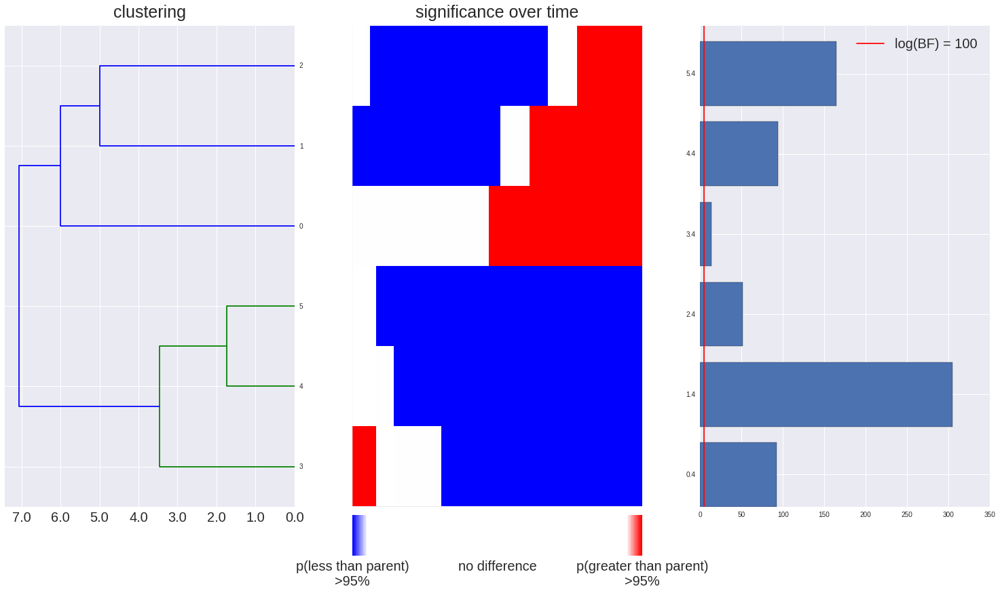

In [81]:
plt.figure(figsize=(26,14))
aspect = 10

ax1 = plt.subplot2grid((aspect+1,3), (0,0), colspan=1, rowspan=aspect)
ax2 = plt.subplot2grid((aspect+1,3), (0,1), colspan=1, rowspan=aspect)
# ax3 = plt.subplot2grid((aspect+1,4), (0,2), colspan=1, rowspan=aspect)
ax4 = plt.subplot2grid((aspect+1,3), (0,2), colspan=1, rowspan=aspect)
cbarAx = plt.subplot2grid((aspect+1,3), (aspect,1), colspan=1, rowspan=2)

# plt.subplot(131)
z = scipy.cluster.hierarchy.linkage(thresh)
ret = scipy.cluster.hierarchy.dendrogram(z,orientation="right",ax=ax1);
yt = ax1.get_yticks()
ax1.set_yticks(yt)
# yl = ["$\Delta "+ l +'$' for l in labels.loc[ret['leaves'],"Strain"].tolist()]
# ax1.set_yticklabels(yl,fontsize=20)
ax1.set_xticklabels(ax1.get_xticks().astype(str),fontsize=20)
ax1.set_title("clustering",fontsize=25,y=1.01)

# plt.subplot(132)
im = ax2.imshow(1-thresh[ret['leaves'],:],cmap=cmap,interpolation="none",aspect="auto",origin="top")
# im = ax2.imshow(1-conf[ret['leaves'],:],cmap=cmap,interpolation="none",aspect="auto",origin="top",vmin=.05,vmax=.95)
ax2.grid(False)
ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_title("significance over time",fontsize=25,y=1.01)
# ax2.set_frame_on(True)

# cbar = plt.colorbar(im,ticks=[0,.5,1],orientation="horizontal",ax=cbarAx)
# cbar.ax.set_xticklabels(['less than parent', 'no difference', 'greater than parent'],fontsize=20)
norm = mpl.colors.Normalize(vmin=0, vmax=1)
cb1 = mpl.colorbar.ColorbarBase(cbarAx, cmap=cmap,
                                norm=norm,
                                orientation='horizontal',ticks=[0,.5,1])
cb1.ax.set_xticklabels(['p(less than parent)\n>95%', 'no difference', 'p(greater than parent)\n>95%'],fontsize=20)

# ax3.barh(range(intConf.shape[0]),1-intConf[ret['leaves']]-.5)
# ax3.plot([-.45,-.45],[0,intConf.shape[0]],'r')
# ax3.plot([.45,.45],[0,intConf.shape[0]],'r')

# ax3.set_ylim(0,intConf.shape[0])
# ax3.set_yticks(np.arange(intConf.shape[0])+.4)
# ax3.set_yticklabels(yl,fontsize=20)
# ax3.set_title("total significance",fontsize=25)

ax4.barh(range(bfs.shape[0]),bfs[ret['leaves']])
ax4.plot([np.log(100),np.log(100)],[0,intConf.shape[0]],'r',label="log(BF) = 100")
# ax4.plot([np.log(10),np.log(10)],[0,intConf.shape[0]],'y')
ax4.legend(loc="best",fontsize=20)

ax4.set_ylim(0,bfs.shape[0])
ax4.set_yticks(np.arange(bfs.shape[0])+.4)
ax4.set_yticklabels(yl,fontsize=20)
ax4.set_title("log(BF)",fontsize=25,y=1.01)
ax4.set_xticklabels(ax4.get_xticks().astype(int).astype(str),fontsize=20)

plt.tight_layout(pad=2.0)
plt.savefig("figures/funcDiff_normal.png",bbox_inches="tight",dpi=300)

## Permutation correction

In [186]:
table = pd.read_csv("standard_bayesFactors.csv")

bfsPermuted = {}
for i,r in table.iterrows():
    bfsPermuted[(r.Strain,r.plate)] = np.array(ast.literal_eval(r.PermutedValues))

In [ ]:
t = np.linspace(5,48)
numPerm = 100

# bfsPermuted = {}

for p in plates:
    strains = db.getExperimentalDesigns("Strain",plate=p)
    for s in strains:
        if s == "ura3" or s == "blank":
            continue
            
        print s,p
        
        if not (s,p) in bfsPermuted:
            bfsPermuted[(s,p)] = []
        
        data = db.getData(plate=p,Strain=["ura3",s],logged=True,**{'mM PQ':0})
        data.data.time = data.data.time - data.data.time.values[0]
        data.poly_scale(5,10,groupby=["Strain","mM PQ"])
        
        strainOrig = data.key.Strain.copy()
        
        orders = []
        
        for i in range(len(bfsPermuted[(s,p)]),numPerm):
            
            if i%10 == 0:
                print i
        
            order = np.random.choice(range(data.key.shape[0]),data.key.shape[0],replace=False)
            orders.append(order)
            
            data.key.Strain = data.key.Strain[order].values

            ts = testStatistic.TestStatistic(data)
            ts_null = testStatistic.TestStatistic(data)
            ts_null.inputDimensions = ['time']
            ts_null.k = 1

            bfsPermuted[(s,p)].append(ts.buildGP().log_likelihood()-ts_null.buildGP().log_likelihood())
            
            data.key.Strain = strainOrig

sirR 20150630 PQ 5
idr1 20150630 PQ 5
troR 20150630 PQ 5
idr2 20150630 PQ 5
sirR 20150630 PQ 5
idr1 20150630 PQ 5
troR 20150630 PQ 5
idr2 20150630 PQ 5
sirR 20150630 PQ 5
idr1 20150630 PQ 5
troR 20150630 PQ 5
idr2 20150630 PQ 5
VNG0194H 20150607 PQ 4
hlx2 20150607 PQ 4
hrg 20150607 PQ 4
rosR 20150607 PQ 4
VNG2268 20150715 PQ 8
VNG1179 20150715 PQ 8
trmB 20150715 PQ 8
VNG2614 20150715 PQ 8
VNG2268 20150715 PQ 8
VNG1179 20150715 PQ 8
trmB 20150715 PQ 8
VNG2614 20150715 PQ 8
trh2 20150517 PQ 3
60

In [205]:
columns = ["Strain",'plate','BayesFactor','FDR','PermutedValues']
table = pd.DataFrame(columns=columns)

for ind,tup in labels.iterrows():
    strain,plate = tup
    
    bf = bfs[ind]
    permBFs = bfsPermuted[(strain,plate)]
    fdr = 1.*np.sum(bfsPermuted[(strain,plate)] > bf)/bfsPermuted[(strain,plate)].shape[0]
    row = pd.DataFrame([[strain,plate,bf,fdr,permBFs.tolist()]],columns=columns)
    table = pd.concat((table,row))
    
table.to_csv("standard_bayesFactors.csv",index=False)

(-1, 28)

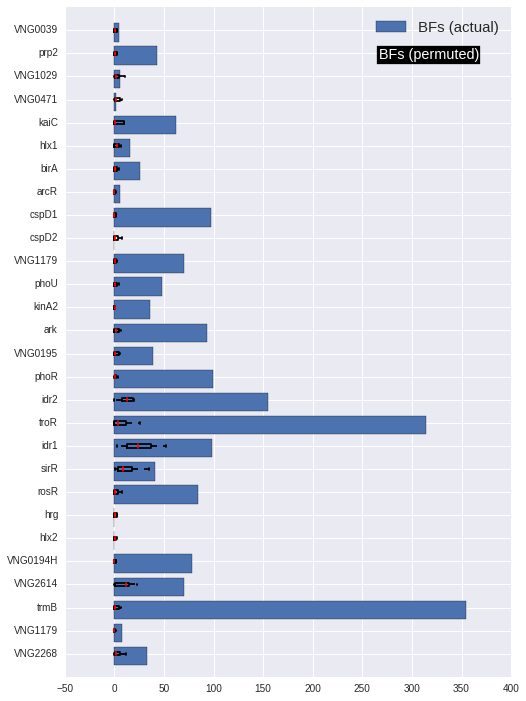

In [141]:
plt.figure(figsize=(8,12))

# plt.plot(bfs,range(28))
plt.barh(np.arange(28)-.5,bfs,label="BFs (actual)")

for i,r in labels.iterrows():
    s,p = r
    plt.boxplot(bfsPermuted[(s,p)],vert=False,positions=[i],boxprops={'color':'k'},whiskerprops={'color':'k'})
    
plt.yticks(range(28),labels.Strain.tolist())

plt.legend(loc="upper right",fontsize=15)

plt.figtext(0.67, 0.84, 'BFs (permuted)',
            backgroundcolor='k',
            color='white', weight='roman', size='x-large')
    
plt.ylim(-1,28)

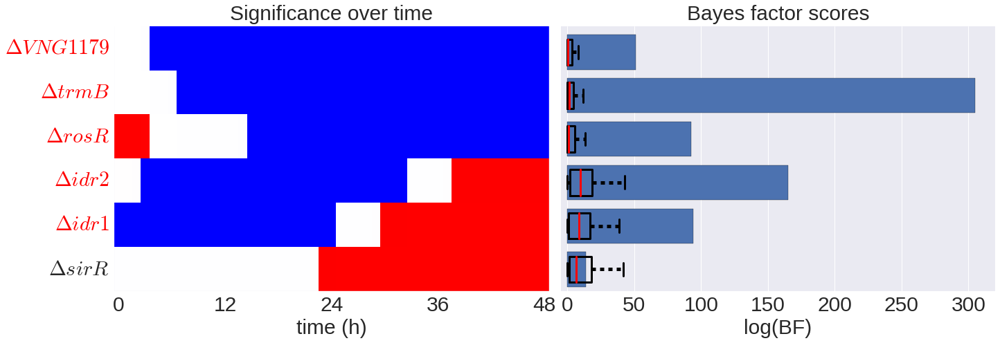

In [167]:
plt.figure(figsize=(20,6))
aspect = 50

# ax1 = plt.subplot2grid((aspect+1,3), (0,0), colspan=1, rowspan=aspect)
ax2 = plt.subplot2grid((aspect+1,2), (0,0), colspan=1, rowspan=aspect)
# ax3 = plt.subplot2grid((aspect+1,4), (0,2), colspan=1, rowspan=aspect)
ax4 = plt.subplot2grid((aspect+1,2), (0,1), colspan=1, rowspan=aspect)
# cbarAx = plt.subplot2grid((aspect+1,2), (aspect,0), colspan=1, rowspan=1)

im = ax2.imshow(1-thresh,cmap=cmap,interpolation="none",aspect="auto",origin="top")
ax2.grid(False)
t = np.linspace(0,48,5,dtype=int)
ax2.set_xticks(t)
ax2.set_xticklabels(ax2.get_xticks().astype(str),fontsize=30)
ax2.set_xlabel("time (h)",fontsize=30)
ax2.set_title("Significance over time",fontsize=30,y=1.01)
yl = ["$\Delta "+ l +'$' for l in strains]
ax2.set_yticks(range(6))
ax2.set_yticklabels(yl,fontsize=30)

norm = mpl.colors.Normalize(vmin=0, vmax=1)
cb1 = mpl.colorbar.ColorbarBase(cbarAx, cmap=cmap,
                                norm=norm,
                                orientation='horizontal',ticks=[0,.5,1])
cb1.ax.set_xticklabels(['p(less than parent)\n>95%', 'no difference', 'p(greater than parent)\n>95%'],fontsize=30)


ax4.barh(np.arange(bfs.shape[0]),bfs,label="BFs (actual)")


# for h,i in enumerate(ret['leaves']):
#     s,p = labels.iloc[i,:].values
for i,v in enumerate(zip(strains,plates)):
    s,p = v
    ax4.boxplot(bfsPermuted[(s,p)],vert=False,positions=[i+.4],widths=[.6],boxprops={'color':'k','linewidth':3},whiskerprops={'color':'k','linewidth':5},capprops={'linewidth':3},medianprops={'linewidth':3})
    

yl = ax2.get_yticklabels()
for i,t in enumerate(yl):
    s,p = zip(strains,plates)[i]
    if np.sum(bfs[i] > bfsPermuted[(s,p)])>bfsPermuted[(s,p)].shape[0]*.9:
        t.set_color('r')

# ax4.legend(loc="best",fontsize=25)

# ax4.text(292, 25, 'BFs (permuted)',
#             backgroundcolor='k',
#             color='white', weight='roman', size=25)

ax4.set_ylim(-.1,bfs.shape[0])
ax4.set_yticks([])
ax4.set_title("Bayes factor scores",fontsize=30,y=1.01)
ax4.set_xticklabels(ax4.get_xticks().astype(int).astype(str),fontsize=30)
ax4.set_xlabel("log(BF)",fontsize=30)
ax4.set_xlim(-5,bfs.max()+15)

plt.tight_layout(pad=.5)
plt.savefig("figures/standard_testStatistic.png",bbox_inches="tight",dpi=150)

In [137]:
conf.shape

(6, 49)

AttributeError: 'list' object has no attribute 'loc'

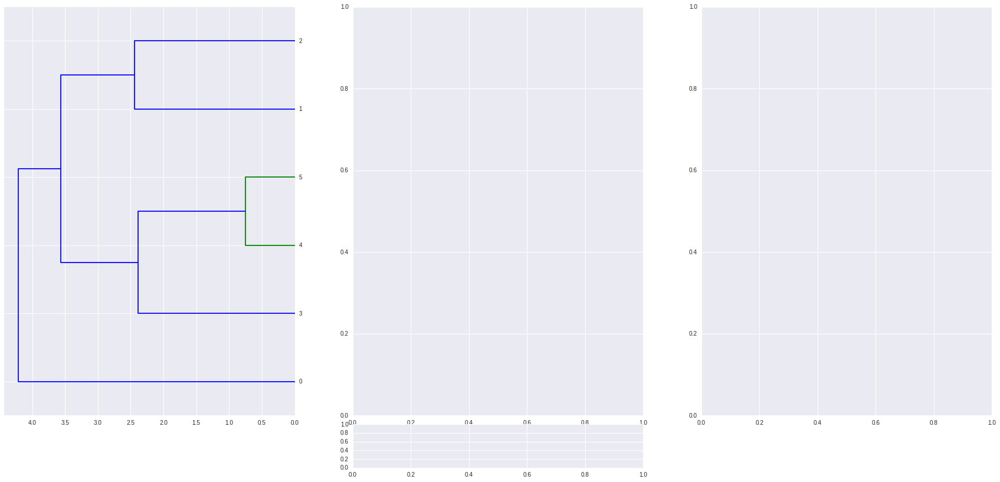

In [83]:
plt.figure(figsize=(30,14))
aspect = 8

ax1 = plt.subplot2grid((aspect+1,3), (0,0), colspan=1, rowspan=aspect)
ax2 = plt.subplot2grid((aspect+1,3), (0,1), colspan=1, rowspan=aspect)
# ax3 = plt.subplot2grid((aspect+1,4), (0,2), colspan=1, rowspan=aspect)
ax4 = plt.subplot2grid((aspect+1,3), (0,2), colspan=1, rowspan=aspect)
cbarAx = plt.subplot2grid((aspect+1,3), (aspect,1), colspan=1, rowspan=2)

# plt.subplot(131)
# z = scipy.cluster.hierarchy.linkage(thresh)
z = scipy.cluster.hierarchy.linkage(conf)
ret = scipy.cluster.hierarchy.dendrogram(z,orientation="right",ax=ax1,color_threshold=2.3);
yt = ax1.get_yticks()
ax1.set_yticks(yt)
yl = ["$\Delta "+ l +'$' for l in labels.loc[ret['leaves'],"Strain"].tolist()]
ax1.set_yticklabels(yl,fontsize=30)
ax1.set_xticklabels(ax1.get_xticks().astype(str),fontsize=30)
ax1.set_title("Hierarchical clustering",fontsize=30,y=1.01)
ax1.set_xlabel("distance (Euclidean)",fontsize=30)

# plt.subplot(132)
im = ax2.imshow(1-thresh[ret['leaves'],:],cmap=cmap,interpolation="none",aspect="auto",origin="top")
ax2.grid(False)
t = np.linspace(0,48,5,dtype=int)
ax2.set_xticks(t)
ax2.set_xticklabels(ax2.get_xticks().astype(str),fontsize=30)
ax2.set_xlabel("time (h)",fontsize=30)
ax2.set_yticks([])
ax2.set_title("Significance over time",fontsize=30,y=1.01)
# ax2.set_frame_on(True)

# cbar = plt.colorbar(im,ticks=[0,.5,1],orientation="horizontal",ax=cbarAx)
# cbar.ax.set_xticklabels(['less than parent', 'no difference', 'greater than parent'],fontsize=20)
norm = mpl.colors.Normalize(vmin=0, vmax=1)
cb1 = mpl.colorbar.ColorbarBase(cbarAx, cmap=cmap,
                                norm=norm,
                                orientation='horizontal',ticks=[0,.5,1])
cb1.ax.set_xticklabels(['p(less than parent)\n>95%', 'no difference', 'p(greater than parent)\n>95%'],fontsize=30)

# ax3.barh(range(intConf.shape[0]),1-intConf[ret['leaves']]-.5)
# ax3.plot([-.45,-.45],[0,intConf.shape[0]],'r')
# ax3.plot([.45,.45],[0,intConf.shape[0]],'r')

# ax3.set_ylim(0,intConf.shape[0])
# ax3.set_yticks(np.arange(intConf.shape[0])+.4)
# ax3.set_yticklabels(yl,fontsize=20)
# ax3.set_title("total significance",fontsize=25)

# ax4.barh(range(bfs.shape[0]),bfs[ret['leaves']])
# ax4.plot([np.log(100),np.log(100)],[0,intConf.shape[0]],'r',label="log(BF) = 100")
# ax4.plot([np.log(10),np.log(10)],[0,intConf.shape[0]],'y')

ax4.barh(np.arange(bfs.shape[0]),bfs[ret['leaves']],label="BFs (actual)")

# for i,r in labels.iterrows():
for h,i in enumerate(ret['leaves']):
    s,p = labels.iloc[i,:].values
    ax4.boxplot(bfsPermuted[(s,p)],vert=False,positions=[h+.5],boxprops={'color':'k'},whiskerprops={'color':'k'})
    
ax4.legend(loc="best",fontsize=25)

ax4.text(292, 25, 'BFs (permuted)',
            backgroundcolor='k',
            color='white', weight='roman', size=25)

ax4.set_ylim(0,bfs.shape[0])
ax4.set_xlim(-5,bfs.max()+5)
ax4.set_yticks(np.arange(bfs.shape[0])+.4)
ax4.set_yticklabels(yl,fontsize=30)


# set significant labels to red
yl = ax4.get_yticklabels()
for i,t in enumerate(yl):
    s,p = labels.iloc[ret['leaves'][i],:].values
    if np.sum(bfs[ret['leaves'][i]] > bfsPermuted[(s,p)])>bfsPermuted[(s,p)].shape[0]*.9:
        t.set_color('r')

yl = ax1.get_yticklabels()
for i,t in enumerate(yl):
    s,p = labels.iloc[ret['leaves'][i],:].values
    if np.sum(bfs[ret['leaves'][i]] > bfsPermuted[(s,p)])>bfsPermuted[(s,p)].shape[0]*.9:
        t.set_color('r')
        
ax4.set_title("Bayes factor scores",fontsize=30,y=1.01)
ax4.set_xticklabels(ax4.get_xticks().astype(int).astype(str),fontsize=30)
ax4.set_xlabel("log(BF)",fontsize=30)

plt.tight_layout(pad=.5)
plt.savefig("figures/funcDiff_normal.png",bbox_inches="tight",dpi=150)

###  generate tex code for supplement

In [131]:
def tex_string(p,s):

    return r"""\begin{subfigure}[b]{.32\linewidth}
    \centering
        \includegraphics[width=.32\linewidth]{figures/supplement/standard/normal_%s_%s.png}
        \includegraphics[width=.32\linewidth]{figures/supplement/standard/growthPrediction_normal_%s_%s.png}
        \includegraphics[width=.32\linewidth]{figures/supplement/standard/functionDiff_normal_%s_%s.png}
        \caption{}
\end{subfigure}
"""% (s,p,s,p,s,p)

In [132]:
ret = ''
for p in plates:
    strains = db.getExperimentalDesigns("Strain",plate=p)
    for s in strains:
        if s == "ura3" or s == "blank":
            continue
            
        ret += tex_string(p,s)
        
print ret

\begin{subfigure}[b]{.32\linewidth}
    \centering
        \includegraphics[width=.32\linewidth]{figures/supplement/standard/normal_VNG2268_20150715 PQ 8.png}
        \includegraphics[width=.32\linewidth]{figures/supplement/standard/growthPrediction_normal_VNG2268_20150715 PQ 8.png}
        \includegraphics[width=.32\linewidth]{figures/supplement/standard/functionDiff_normal_VNG2268_20150715 PQ 8.png}
        \caption{}
\end{subfigure}
\begin{subfigure}[b]{.32\linewidth}
    \centering
        \includegraphics[width=.32\linewidth]{figures/supplement/standard/normal_VNG1179_20150715 PQ 8.png}
        \includegraphics[width=.32\linewidth]{figures/supplement/standard/growthPrediction_normal_VNG1179_20150715 PQ 8.png}
        \includegraphics[width=.32\linewidth]{figures/supplement/standard/functionDiff_normal_VNG1179_20150715 PQ 8.png}
        \caption{}
\end{subfigure}
\begin{subfigure}[b]{.32\linewidth}
    \centering
        \includegraphics[width=.32\linewidth]{figures/supplement/stan